In [1]:
import numpy as np
import plotly.express as px
import pandas as pd

import sys
import os
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from sandwich_numerical.sandwich import Sandwich

## Assemble 2 meshes. $\mu = 1$ in one mesh and $\mu = 1000$ in another one

In [2]:
block_height = 21
mesh_height = block_height * 3
block_size = (block_height, 3000)
grid_step = 0.005
mu_1 = 1
mu_2 = 1000

base_grad_vec = np.sin((2 * np.pi) / (mesh_height-1) * np.arange(mesh_height))

grad_vec_1 = np.copy(base_grad_vec)
mesh_1 = Sandwich(
    block_size,
    grad_vec_1,
    grid_step,
    mu_1
)

grad_vec_1000 = np.copy(base_grad_vec)
# grad_vec_1000[block_size[0]:2*block_size[0]] *= mu_2
mesh_1000 = Sandwich(
    block_size,
    grad_vec_1000,
    grid_step,
    mu_2
)

Run 10_000 iterations on each mesh

In [3]:
def process_mesh(mesh, iter_count):
    residuals = []
    for i in range(iter_count):
        mesh.step()
        if i % 100_000 == 0:
            print(i)
            residuals.append((i, mesh.get_residual()))
            
    return residuals

In [4]:
iter_count = 10_000

residuals_1 = process_mesh(mesh_1, iter_count)
residuals_1000 = process_mesh(mesh_1000, iter_count)

0
0


Analyze the distributions of displacements

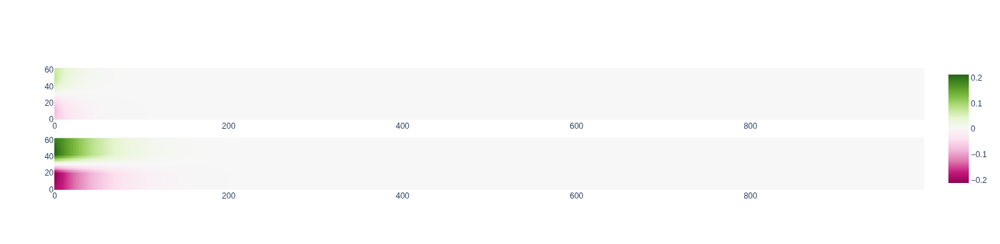

In [5]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :1000]).data[0], row=1, col=1)
fig.add_trace(px.imshow(mesh_1000.get_displacement_array()[:, :1000]).data[0], row=2, col=1)

fig.update_layout()
fig.show()

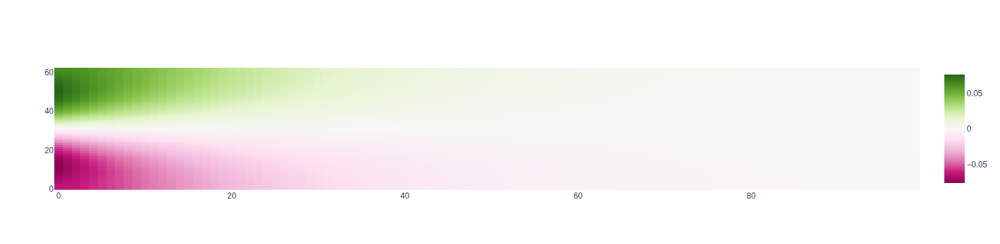

In [6]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(px.imshow(mesh_1.get_displacement_array()[:, :100]).data[0], row=1, col=1)

fig.update_layout()
fig.show()

In [7]:
px.line(pd.DataFrame(residuals_1000, columns=['iter', 'res']), x='iter', y='res')

# Let's look at the cros section displacement distribution

In [8]:
def get_samples_df(mesh):
    displacement_data = mesh.get_displacement_array()
    
    sample_size = displacement_data.shape[0]
    return pd.DataFrame({
        'x2': np.arange(mesh_height) * grid_step,
        'x1=0.0': displacement_data[:, 0],
        'x1=0.2': displacement_data[:, 40],
        'x1=0.4': displacement_data[:, 80],
        'x1=1.0': displacement_data[:, 200]
    })

def plot_samples_data(mesh):
    df = get_samples_df(mesh)
    return px.line(df, x='x2', y=['x1=0.0', 'x1=0.2', 'x1=0.4', 'x1=1.0'])

### $\mu=1$

In [9]:
plot_samples_data(mesh_1)

### $\mu=1000$

In [10]:
plot_samples_data(mesh_1000)

In [11]:
def displacement_data_to_df(mesh):
    displacement_data = mesh.get_displacement_array()
    result_dict = {
        'x2_mesh_id': np.arange(mesh_height),
        'x2_bottom': np.arange(mesh_height) * grid_step,
        'x2_top': np.arange(mesh_height)
    }
    result_dict['x2_bottom'] = result_dict['x2_mesh_id'] * grid_step
    result_dict['x2_top'] = result_dict['x2_bottom'] + grid_step
    
    for i in range(displacement_data.shape[1]):
        result_dict['x1=%.4f' % (i * grid_step)] = displacement_data[:, i]
        
    return pd.DataFrame(result_dict)

In [12]:
displacement_data_to_df(mesh_1).to_csv('/tmp/displacement_mu_1.csv', index=False)
displacement_data_to_df(mesh_1000).to_csv('/tmp/displacement_mu_1000.csv', index=False)

In [13]:
displacement_data_to_df(mesh_1)

,x2_mesh_id,x2_bottom,x2_top,x1=0.0000,x1=0.0050,x1=0.0100,x1=0.0150,x1=0.0200,x1=0.0250,x1=0.0300,...,x1=14.9500,x1=14.9550,x1=14.9600,x1=14.9650,x1=14.9700,x1=14.9750,x1=14.9800,x1=14.9850,x1=14.9900,x1=14.9950
0,0,0.000,0.005,-0.063123,-0.063123,-0.061998,-0.060494,-0.058748,-0.056849,-0.054855,...,2.282054e-171,1.955577e-171,1.656106e-171,1.379456e-171,1.121779e-171,8.795085e-172,6.493010e-172,4.279906e-172,2.125407e-172,0.0
1,1,0.005,0.010,-0.063629,-0.063123,-0.061998,-0.060494,-0.058748,-0.056849,-0.054855,...,2.299009e-171,1.970069e-171,1.668351e-171,1.389636e-171,1.130044e-171,8.859800e-172,6.540738e-172,4.311343e-172,2.141012e-172,0.0
2,2,0.010,0.015,-0.064750,-0.063743,-0.062377,-0.060735,-0.058902,-0.056943,-0.054906,...,2.318232e-171,1.986498e-171,1.682231e-171,1.401173e-171,1.139410e-171,8.933128e-172,6.594813e-172,4.346960e-172,2.158691e-172,0.0
3,3,0.015,0.020,-0.066220,-0.064723,-0.063030,-0.061169,-0.059183,-0.057114,-0.054998,...,2.339745e-171,2.004880e-171,1.697759e-171,1.414080e-171,1.149887e-171,9.015146e-172,6.655294e-172,4.386794e-172,2.178463e-172,0.0
4,4,0.020,0.025,-0.067872,-0.065900,-0.063850,-0.061727,-0.059547,-0.057334,-0.055108,...,2.363572e-171,2.025237e-171,1.714954e-171,1.428370e-171,1.161486e-171,9.105943e-172,6.722245e-172,4.430887e-172,2.200349e-172,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,58,0.290,0.295,0.068019,0.066047,0.063997,0.061873,0.059693,0.057480,0.055254,...,2.565106e-171,2.197212e-171,1.860116e-171,1.548882e-171,1.259254e-171,9.870644e-172,7.285979e-172,4.801939e-172,2.384526e-172,0.0
59,59,0.295,0.300,0.066367,0.064870,0.063176,0.061315,0.059329,0.057261,0.055144,...,2.548410e-171,2.183040e-171,1.848078e-171,1.538941e-171,1.251140e-171,9.807519e-172,7.239165e-172,4.771295e-172,2.369226e-172,0.0
60,60,0.300,0.305,0.064896,0.063890,0.062523,0.060882,0.059049,0.057089,0.055052,...,2.534250e-171,2.170860e-171,1.837867e-171,1.530396e-171,1.244256e-171,9.753257e-172,7.199443e-172,4.744952e-172,2.356244e-172,0.0
61,61,0.305,0.310,0.063776,0.063270,0.062144,0.060640,0.058895,0.056995,0.055001,...,2.522405e-171,2.160830e-171,1.829324e-171,1.523359e-171,1.238496e-171,9.708563e-172,7.166207e-172,4.723252e-172,2.345381e-172,0.0
